In [ ]:
!pip install -q torch torchvision torchaudio transformers datasets torchmetrics gradio supervision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 21.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.2/57.2 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.4/320.4 kB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 37.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.2/73.2 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19

In [ ]:
from transformers import AutoImageProcessor, AutoModelForObjectDetection
import torch
from PIL import Image
import requests

id2label = {
    0: "Infiltration",
    1: "Atelectasis",
    2: "Cardiomegaly",
    3: "Pleural effusion",
    4: "Pneumothorax",
    5: "Nodule/Mass",
}

label2id = {v: k for k, v in id2label.items()}

In [ ]:
!unzip detr_nih.zip

Archive:  detr_nih.zip
   creating: detr_nih/
  inflating: detr_nih/preprocessor_config.json  
  inflating: detr_nih/config.json    
  inflating: detr_nih/model.safetensors  
  inflating: detr_nih/training_args.bin  


In [ ]:
from transformers import AutoModelForObjectDetection, AutoImageProcessor, DetrForObjectDetection

model = DetrForObjectDetection.from_pretrained(
    "/content/detr_nih",
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,
    )

processor = AutoImageProcessor.from_pretrained("facebook/detr-resnet-50")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/290 [00:00<?, ?B/s]

In [ ]:
import gradio as gr
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import ImageDraw, Image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
def predict(image):
    inputs = processor(images=image, return_tensors="pt").to(device)
    outputs = model(**inputs)

    target_sizes = torch.tensor([image.size[::-1]])
    results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.1)[0]

    draw = ImageDraw.Draw(image)
    for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
        box = [round(i, 2) for i in box.tolist()]
        draw.rectangle(box, outline="red", width=2)
        draw.text((box[0], box[1]), f"{model.config.id2label[label.item()]}  {score:.2f}", fill="red", font_size=20)

    return image 

In [ ]:
iface = gr.Interface(
    fn=predict,
    inputs=gr.Image(type="pil"),
    outputs=gr.Image(type="pil"),
    title="NIH X-Ray Detection",
).launch()

Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://a43ed9dfd4f7d1e4c9.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
import torch
import torchvision.transforms as T
from PIL import Image
from transformers import DetrForObjectDetection, DetrFeatureExtractor
import matplotlib.pyplot as plt
import numpy as np

feature_extractor = DetrFeatureExtractor.from_pretrained('facebook/detr-resnet-50')

/usr/local/lib/python3.10/dist-packages/transformers/models/detr/feature_extraction_detr.py:38: FutureWarning: The class DetrFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use DetrImageProcessor instead.
  warnings.warn(


In [ ]:
image = Image.open("/content/00019187_000.png").convert("RGB")
inputs = feature_extractor(images=image, return_tensors="pt")

In [ ]:
outputs = model(**inputs, output_attentions=True)

In [ ]:
outputs.keys()

odict_keys(['logits', 'pred_boxes', 'last_hidden_state', 'decoder_attentions', 'cross_attentions', 'encoder_last_hidden_state', 'encoder_attentions'])

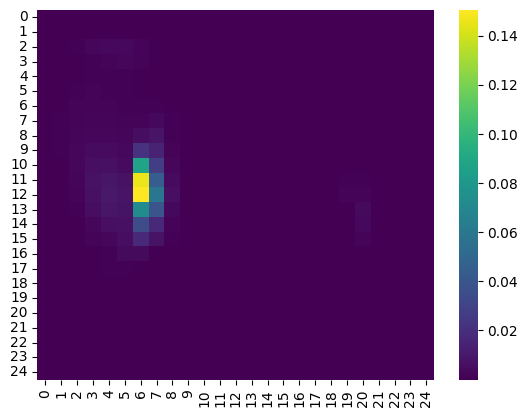

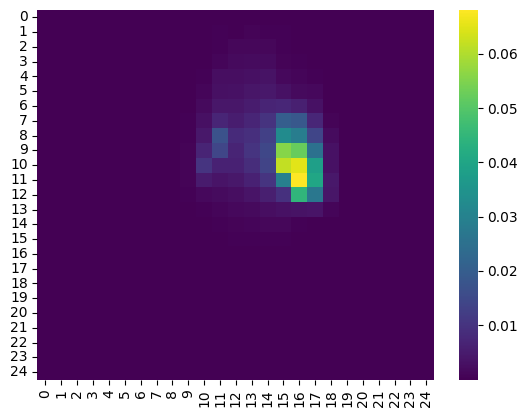

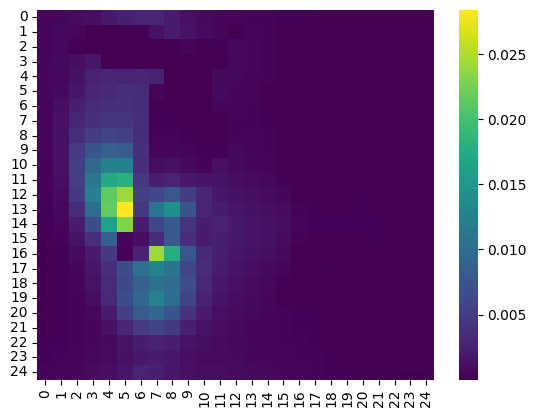

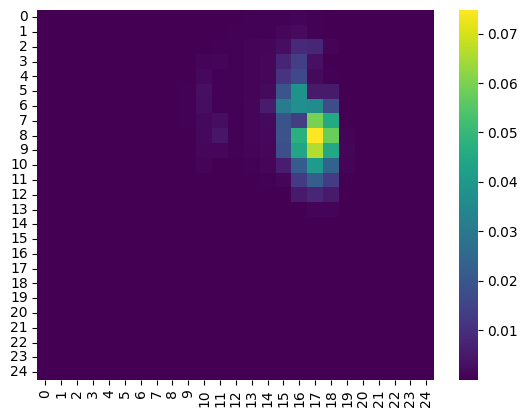

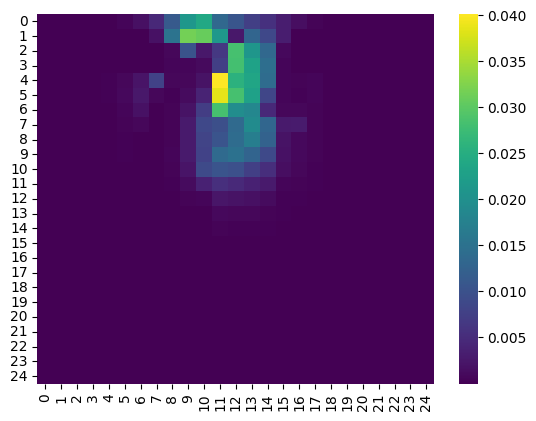

...

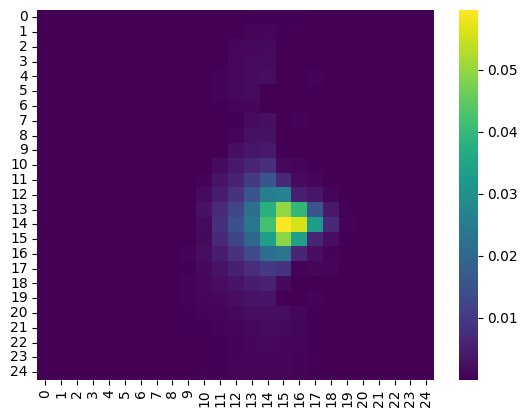

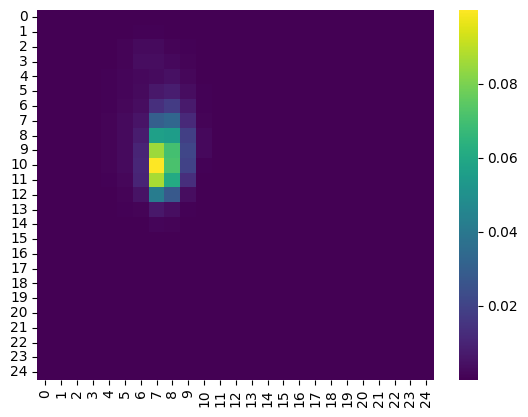

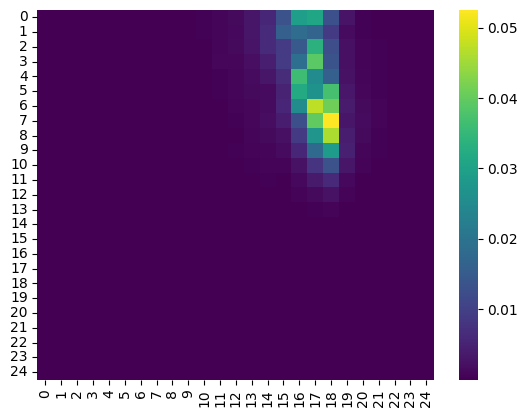

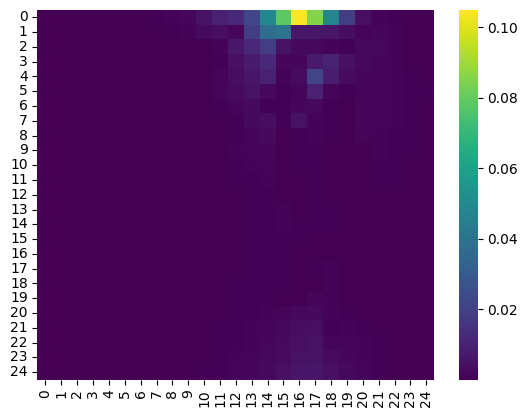

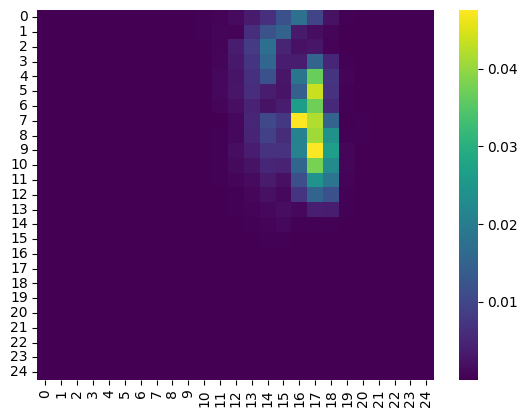

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

attention_map = outputs.cross_attentions[0][0, 0, :, :]

for attentions in attention_map:
    attention_map_resized = attentions.reshape(25, 25).detach().cpu().numpy()
    sns.heatmap(attention_map_resized, cmap="viridis")
    plt.show()

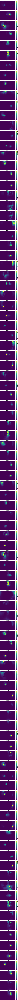

In [ ]:
outputs = model(**inputs, output_attentions=True) 

probas = outputs.logits.softmax(-1)[0, :, :-1]
keep = probas.max(-1).values > 0.9

cross_attention_weights = outputs.cross_attentions[0]  # (batch_size, num_heads, query_len, key_len)

num_queries = cross_attention_weights.shape[2]  # query_len

fig, axes = plt.subplots(nrows=num_queries, ncols=1, figsize=(10, num_queries * 5))

for i in range(num_queries):
    attention_map = cross_attention_weights[0, 0, i, :]  # (key_len)

    h, w = inputs['pixel_values'].shape[-2:]
    attention_map_resized = attention_map.reshape(h // 32 , w // 32).detach().cpu().numpy()

    sns.heatmap(attention_map_resized, cmap="viridis", ax=axes[i])
    axes[i].set_title(f"Attention Map for Query {i}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

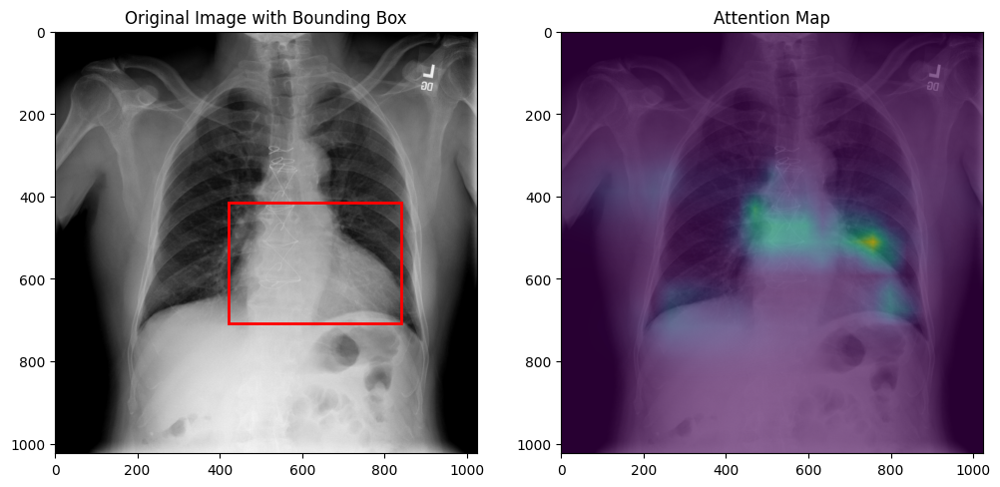

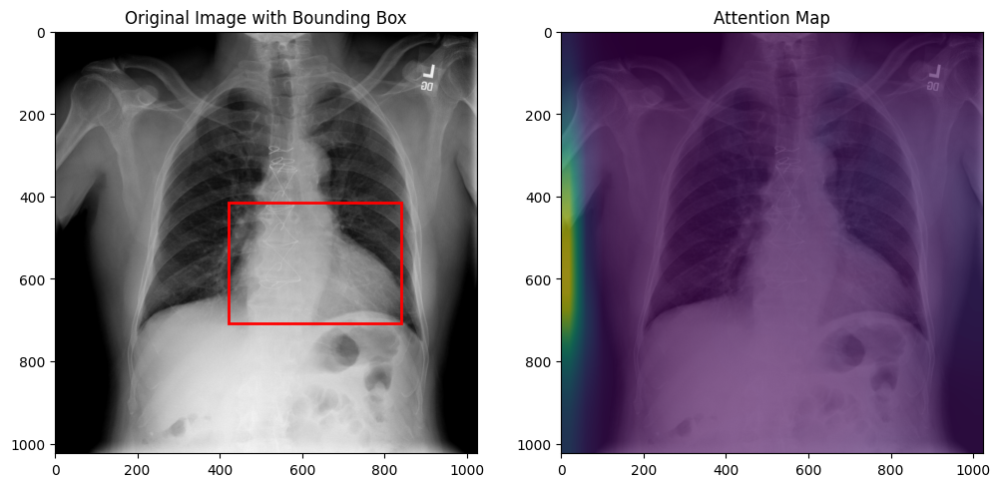

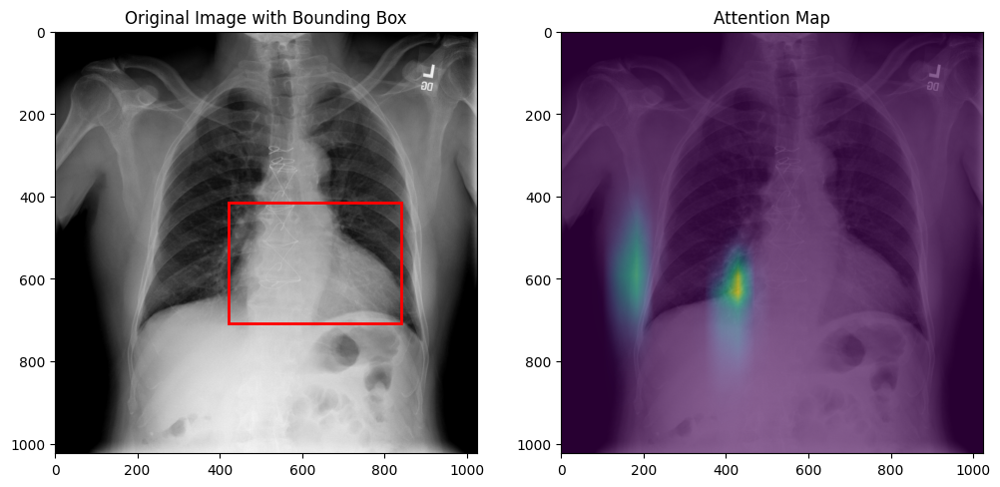

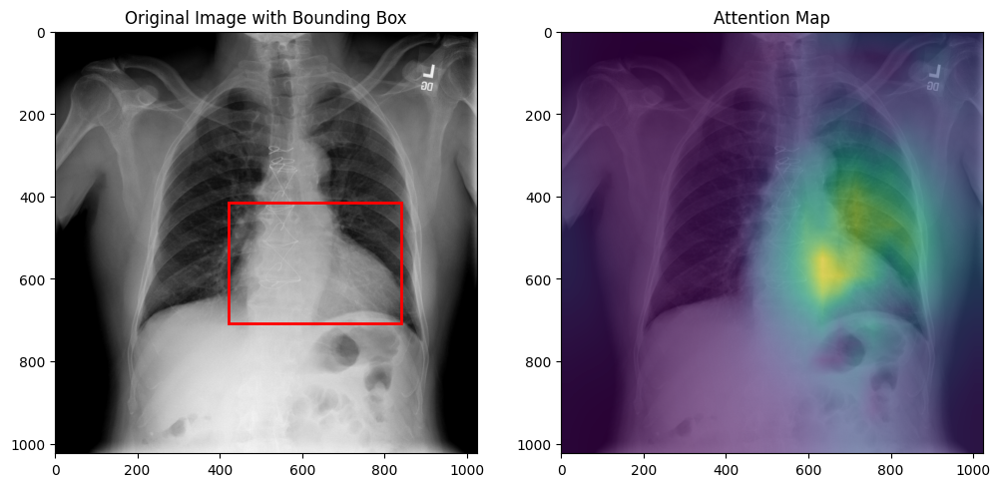

In [ ]:
inputs = processor(images=image, return_tensors="pt")

outputs = model(**inputs, output_attentions= True)

logits = outputs.logits
bboxes = outputs.pred_boxes
attentions = outputs.cross_attentions  # Decoder dikkat haritaları

def plot_attention_map(image, attention_map, bbox):
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    ax[0].imshow(image)
    bbox = bbox.detach().cpu().numpy().tolist()
    ax[0].add_patch(plt.Rectangle(
        (bbox[0], bbox[1]), bbox[2]-bbox[0], bbox[3]-bbox[1],
        fill=False, color='red', linewidth=2
    ))
    ax[0].set_title("Original Image with Bounding Box")

    attention_map_resized = attention_map.reshape(25, 25)

    attention_map_image = Image.fromarray(attention_map_resized)

    resized_attention_map = attention_map_image.resize((1024, 1024), resample=Image.BILINEAR)
    ax[1].imshow(image)
    ax[1].imshow(np.array(resized_attention_map), cmap='viridis', alpha=0.6)
    ax[1].set_title("Attention Map")
    plt.show()

scores = logits.softmax(-1)[0, :, :-1].max(-1).values
threshold = 0.1 
keep = scores > threshold

target_sizes = torch.tensor([image.size])
for box, attention in zip(bboxes[0, keep], attentions[-1][0, :, keep].detach().cpu().numpy()):
    box = processor.post_process_object_detection(
        outputs,
        threshold=threshold,
        target_sizes=target_sizes
    )[0]["boxes"][0]
    plot_attention_map(image, attention.sum(0), box)


In [ ]:
inputs['pixel_values'].shape

torch.Size([1, 3, 800, 800])

In [ ]:
outputs.cross_attentions[-1].shape

torch.Size([1, 8, 100, 625])

tensor([False, False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False, False,
        False, False, False, False, False,  True, False, False, False, False,
        False, False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True, False,
        False, False, False, False, False, False, False, False, False, False])
torch.Size([4, 625])
tensor([45, 59, 71, 88])


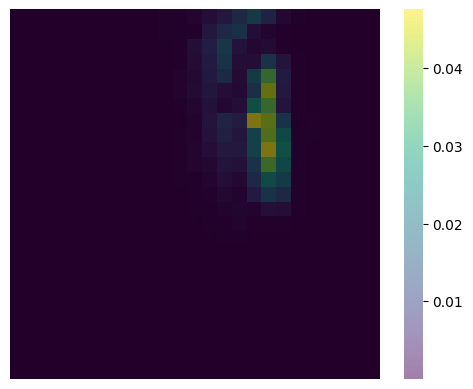

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

probas = outputs.logits.softmax(-1)[0, :, :-1]
keep = probas.max(-1).values > 0.1

indices = keep.nonzero().squeeze()

attention_maps = outputs.cross_attentions[0][0, 0, indices, :]
print(keep)
print(attention_maps.shape)
print(indices)
h, w = inputs['pixel_values'].shape[-2:]
attention_map_resized = attention_map.view(h // 32, w // 32).detach().cpu().numpy()

plt.imshow(image)
sns.heatmap(attention_map_resized, alpha=0.5, cmap="viridis", xticklabels=False, yticklabels=False)
plt.show()

In [ ]:
from PIL import Image

attention_map = cross_attention_weights[0, 0, 71, :]  # (key_len)

h, w = inputs['pixel_values'].shape[-2:]
attention_map_resized = attention_map.reshape(h // 32 , w // 32).detach().cpu().numpy()

attention_map_image = Image.fromarray(attention_map_resized)

resized_attention_map = attention_map_image.resize((800, 800), resample=Image.BILINEAR)

resized_attention_map = np.array(resized_attention_map)

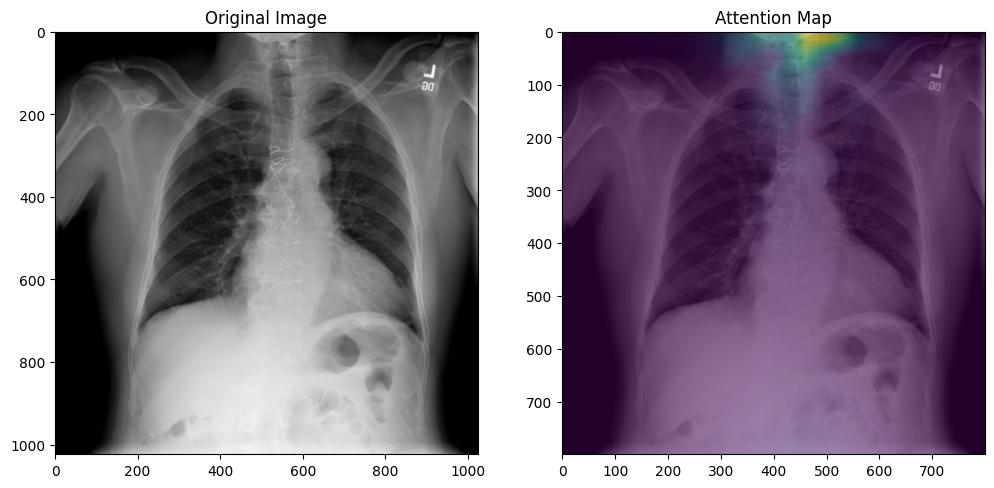

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Orijinal resim
ax[0].imshow(image)
ax[0].set_title("Original Image")

# Attention haritası
ax[1].imshow(image.resize((800,800), resample=Image.BILINEAR))  # Arka plan olarak orijinal resim
ax[1].imshow(resized_attention_map, alpha=0.5, cmap="viridis")  # Attention haritası (şeffaf)
ax[1].set_title("Attention Map")

plt.show()

In [ ]:
from transformers import DetrImageProcessor, DetrForObjectDetection
import torch
from PIL import Image
import requests
'''
url = "http://images.cocodataset.org/val2017/000000039769.jpg"
'''
image = Image.open('/content/00019187_000.png').convert("RGB")

model = DetrForObjectDetection.from_pretrained(
    "/content/detr_nih",
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,
    )

processor = AutoImageProcessor.from_pretrained("facebook/detr-resnet-50")
'''
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50", revision="no_timm")
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50", revision="no_timm")
'''
inputs = processor(images=image, return_tensors="pt")
outputs = model(**inputs, output_attentions=True)

target_sizes = torch.tensor([image.size[::-1]])
results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.1)[0]

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    print(
            f"Detected {model.config.id2label[label.item()]} with confidence "
            f"{round(score.item(), 3)} at location {box}"
    )

Detected Cardiomegaly with confidence 0.269 at location [421.0, 414.76, 839.99, 707.55]
Detected Infiltration with confidence 0.128 at location [215.54, 217.3, 869.42, 683.18]
Detected Cardiomegaly with confidence 0.631 at location [397.19, 375.39, 861.34, 753.76]
Detected Atelectasis with confidence 0.126 at location [212.62, 550.86, 869.69, 699.46]


torch.Size([1, 3, 800, 800])


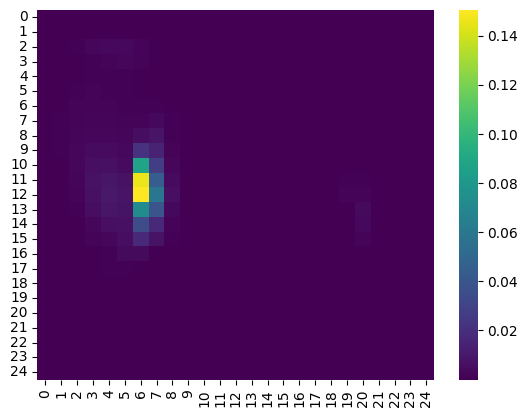

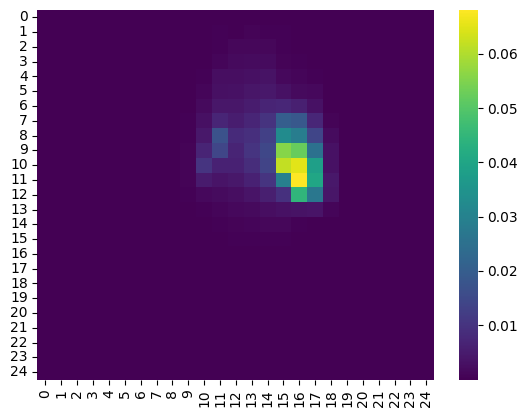

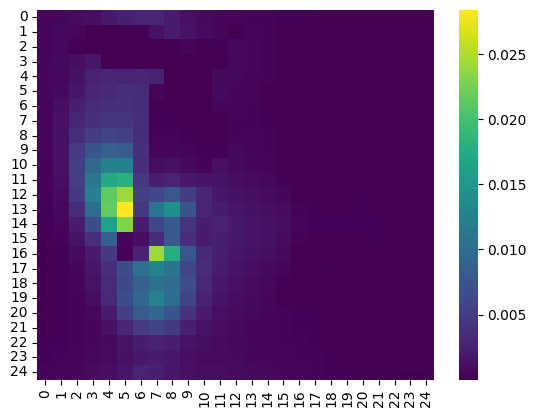

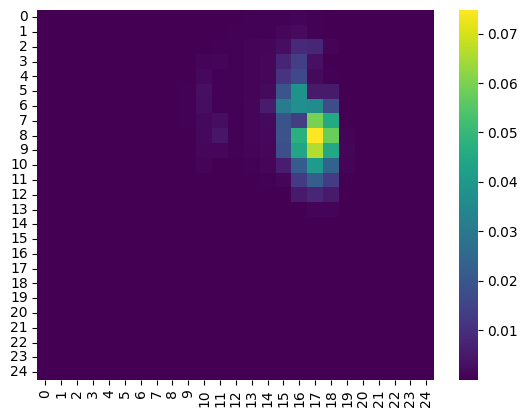

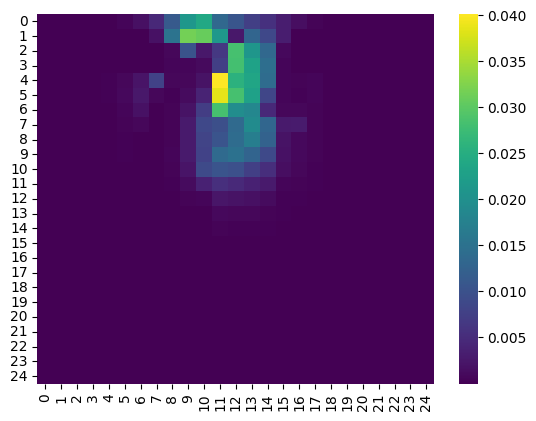

...

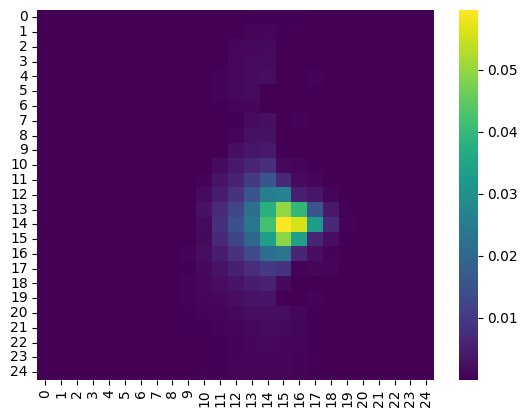

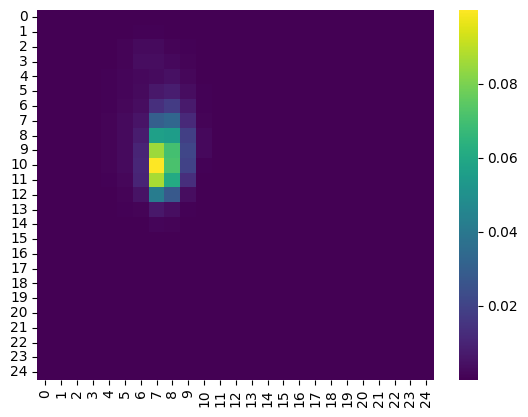

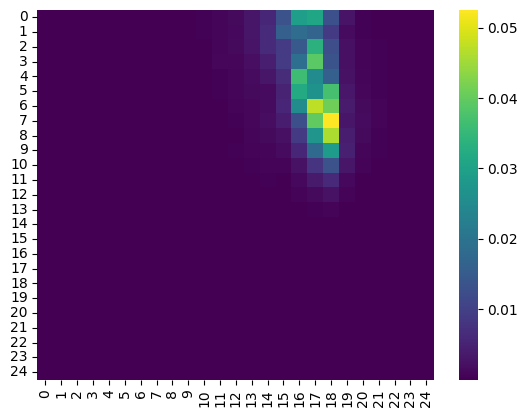

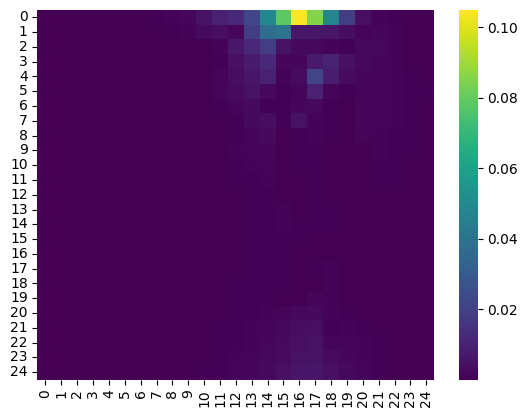

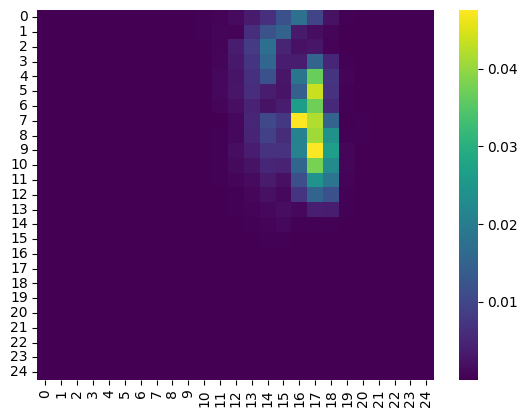

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

attention_map = outputs.cross_attentions[0][0, 0, :, :]
print(inputs['pixel_values'].shape)
for attentions in attention_map:
    attention_map_resized = attentions.reshape(25, 25).detach().cpu().numpy()
    sns.heatmap(attention_map_resized, cmap="viridis")
    plt.show()

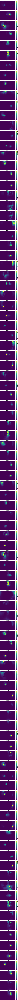

In [ ]:
probas = outputs.logits.softmax(-1)[0, :, :-1]
keep = probas.max(-1).values > 0.1 

cross_attention_weights = outputs.cross_attentions[0]  # (batch_size, num_heads, query_len, key_len)

num_queries = cross_attention_weights.shape[2]  # query_len

fig, axes = plt.subplots(nrows=num_queries, ncols=1, figsize=(10, num_queries * 5))

for i in range(num_queries):
    attention_map = cross_attention_weights[0, 0, i, :]  # (key_len)
    h, w = inputs['pixel_values'].shape[-2:]
    attention_map_resized = attention_map.reshape(25 , 25).detach().cpu().numpy() 

    # Görselleştirme
    sns.heatmap(attention_map_resized, cmap="viridis", ax=axes[i])
    axes[i].set_title(f"Attention Map for Query {i}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
indices[0]

tensor(45)

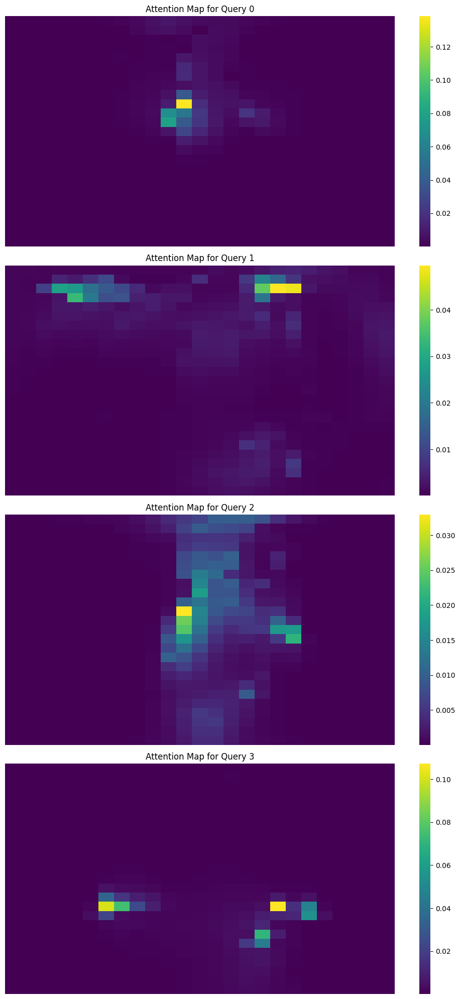

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

probas = outputs.logits.softmax(-1)[0, :, :-1]
keep = probas.max(-1).values > 0.1

if len(keep.nonzero()) == 1:
    indices = keep.nonzero().squeeze(0)
else:
    indices = keep.nonzero().squeeze()

num_queries = len(indices)

if num_queries == 1:
    fig, axes = plt.subplots(figsize = (10, 5))
    axes = [axes]
else:
    fig, axes = plt.subplots(nrows=num_queries, ncols=1, figsize=(10, num_queries * 5))

all_head_attentions = outputs.cross_attentions[0][0]  # (8, 100, 850)

mean_attention = torch.mean(all_head_attentions, dim=0)
for i in range(num_queries):
    attention_map = mean_attention[indices[i], :]  # (key_len)

    h, w = inputs['pixel_values'].shape[-2:]
    attention_map_resized = attention_map.reshape(25 , 25).detach().cpu().numpy()

    # Görselleştirme
    sns.heatmap(attention_map_resized, cmap="viridis", ax=axes[i])
    axes[i].set_title(f"Attention Map for Query {i}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

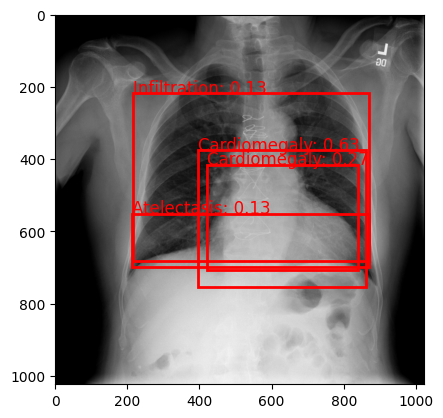

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

fig, ax = plt.subplots(1)
ax.imshow(image)

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]

    rect = patches.Rectangle(
        (box[0], box[1]),
        box[2] - box[0],
        box[3] - box[1],
        linewidth=2,
        edgecolor="r",
        facecolor="none",
    )

    ax.add_patch(rect)

    ax.text(
        box[0],
        box[1],
        f"{model.config.id2label[label.item()]}: {score:.2f}",  
        color="r",
        fontsize=12,
    )

plt.show()

In [ ]:
outputs.cross_attentions[0].shape

torch.Size([1, 8, 100, 625])

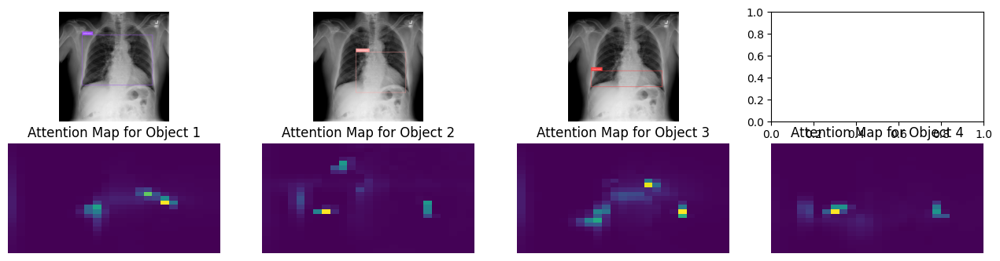

In [ ]:
import supervision as sv
import copy

detections = sv.Detections.from_transformers(results).with_nms(threshold=0.1)
labels = [
    model.config.id2label[class_id]
    for class_id
    in detections.class_id
]
detection_images = []
for idx in range(len(detections)):
    image_copy = image.copy()
    annotated_image = sv.BoxAnnotator().annotate(image_copy, detections[idx])
    annotated_image = sv.LabelAnnotator().annotate(annotated_image, detections[idx], labels=[labels[idx]])
    detection_images.append(annotated_image)

fig, axes = plt.subplots(2, num_queries, figsize=(num_queries * 4, 4))

if len(detection_images) == 1:
    axes = [[axes[0]], [axes[1]]]

for i, detected_image in enumerate(detection_images):
    axes[0][i].imshow(detected_image)
    axes[0][i].axis('off')

probas = outputs.logits.softmax(-1)[0, :, :-1]
keep = probas.max(-1).values > 0.1

if len(keep.nonzero()) == 1:
    indices = keep.nonzero().squeeze(0)
else:
    indices = keep.nonzero().squeeze()

all_head_attentions = outputs.cross_attentions[-1][0]  # (8, 100, 850)

mean_attention = torch.mean(all_head_attentions, dim=0)
for i in range(num_queries):
    attention_map = mean_attention[indices[i], :]  # (key_len)

    attention_map_resized = attention_map.reshape(25 , 25).detach().cpu().numpy() 
    # Görselleştirme
    sns.heatmap(attention_map_resized, cmap="viridis", cbar=False, ax=axes[1][i])
    axes[1][i].set_title(f"Attention Map for Object {i+1}")
    axes[1][i].axis("off")

plt.show()

In [ ]:
attention_map_resized = attention_map.reshape(25, 25).detach().cpu().numpy()
attention_map_resized = Image.fromarray(attention_map_resized)
attention_map_resized = attention_map_resized.resize((1024, 1024), resample=Image.BILINEAR)
attention_map_resized = np.array(attention_map_resized)

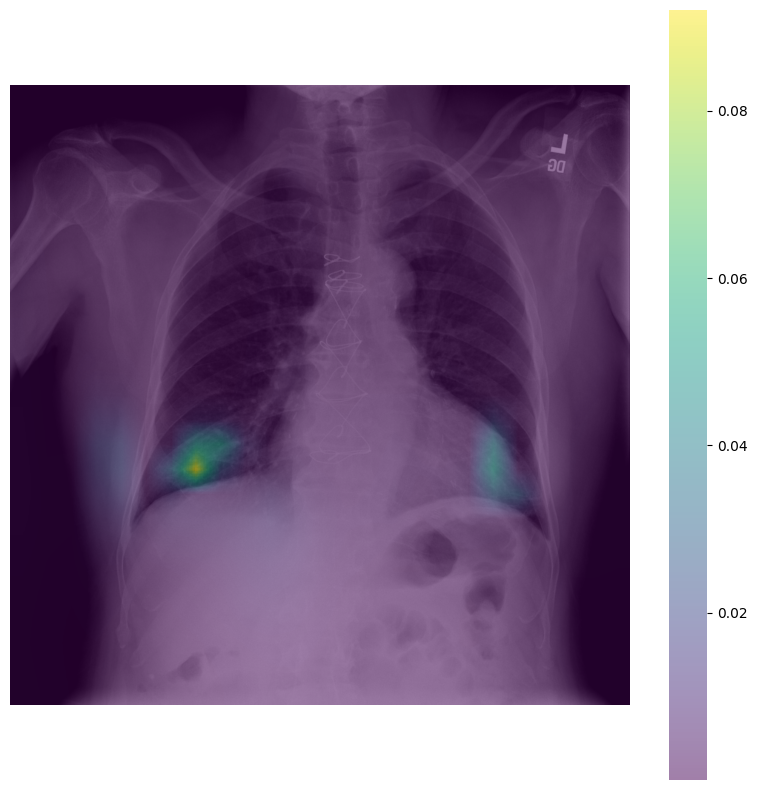

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
sns.heatmap(attention_map_resized, alpha=0.5, cmap="viridis", xticklabels=False, yticklabels=False)
plt.show()